In [132]:
%matplotlib inline
import csv
import random
from numpy import *
import random
from collections import Counter
from wordcloud import *
from altair import *
from nltk import tokenize
from nltk.corpus import stopwords
import os
import string
import math
import operator
from operator import itemgetter
import re
import pandas as pd
import requests
import numpy as np
import networkx as nx
import matplotlib
from matplotlib import pyplot
import matplotlib.pyplot as plt
from ggplot import*
import plotly as py
import plotly.graph_objs as go
import seaborn as sbn
import textatistic
from IPython.display import display, Markdown
from bs4 import BeautifulSoup
matplotlib.style.use('ggplot')
py.offline.init_notebook_mode()
import psycopg2
py.offline.init_notebook_mode()

In [133]:
aisles = pd.read_csv('/home/faculty/millbr02/pub/ecomm/aisles.csv')
aisles.head(1)

,aisle_id,aisle
0,1,prepared soups salads


In [134]:
dept= pd.read_csv('/home/faculty/millbr02/pub/ecomm/departments.csv')
dept.head(1)

,department_id,department
0,1,frozen


In [135]:
prior= pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__prior.csv')
prior.head(1)

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1


In [136]:
train= pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__train.csv')
train.head(1)

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1


In [137]:
order = pd.read_csv('/home/faculty/millbr02/pub/ecomm/orders.csv')
order.head(1)

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN


In [138]:
product = pd.read_csv('/home/faculty/millbr02/pub/ecomm/products.csv')
product.head(1)

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19


In [139]:
df = train[train.add_to_cart_order == 1]
df.head(1)

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1


In [140]:
sort = df.groupby(df.product_id)['product_id'].count().sort_values(ascending=False).head(1)
n_sort = pd.DataFrame(sort)
n_sort.columns = ['Count']
n_sort= n_sort.reset_index()
n_sort.head(1)

,product_id,Count
0,24852,4605


In [141]:
product[product.product_id == 24852]

,product_id,product_name,aisle_id,department_id
24851,24852,Banana,24,4


In [ ]:
#Banana

In [142]:
merge = pd.merge(n_sort, product)
merge.head(1)

,product_id,Count,product_name,aisle_id,department_id
0,24852,4605,Banana,24,4


In [143]:
aco = train.groupby('order_id')['add_to_cart_order'].max()
aco = pd.DataFrame(aco)
aco = aco.reset_index()
aco.head(1)

,order_id,add_to_cart_order
0,1,8


{'bodies': [<matplotlib.collections.PolyCollection at 0x7f045ec083c8>],
 'cbars': <matplotlib.collections.LineCollection at 0x7f045ec08da0>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7f045ec08860>,
 'cmeans': <matplotlib.collections.LineCollection at 0x7f045ec08320>,
 'cmedians': <matplotlib.collections.LineCollection at 0x7f045ec0d080>,
 'cmins': <matplotlib.collections.LineCollection at 0x7f045ec08b00>}

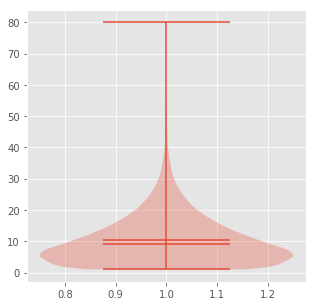

In [145]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5,5))
axes.violinplot(aco['add_to_cart_order'], showmeans=True, showmedians=True)

In [180]:
train_pivot = pd.pivot_table(train[train.order_id < 50], index='order_id', columns='product_id', values='add_to_cart_order')
train_pivot.head(1)

product_id,4461,10246,11109,11913,13176,18159,19660,21616,22035,23622,...,42625,43086,43633,46620,46979,47209,48679,49235,49302,49683
order_id,,,,,,,,,,,,,,,,,,,,,
1,NaN,3.0,2.0,NaN,6.0,NaN,NaN,NaN,8.0,NaN,...,NaN,NaN,5.0,NaN,NaN,7.0,NaN,NaN,1.0,4.0


In [147]:
train_pivot.iloc[0][train_pivot.iloc[0].notnull()]

product_id
10246    3.0
11109    2.0
13176    6.0
22035    8.0
43633    5.0
47209    7.0
49302    1.0
49683    4.0
Name: 1, dtype: float64

In [182]:
sort_order = train.sort_values('order_id')
sort_order.head(1)

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1


# Prodcut_ID Recommendation

In [151]:
dict_product_id = {}
for i,row in sort_order.iterrows():
    current = row['order_id']
    if current not in dict_product_id :
        dict_product_id [current] = [row['product_id']]
    else:
        dict_product_id[current].append(row['product_id'])

In [152]:
list_of_product_id = list(dict_product_id.values())

In [154]:
product_id_matrix = {}
for p_ids in list_of_product_id:
    for pid in p_ids:
        if pid not in product_id_matrix:
            count = 1
            product_id_matrix[pid] = {k:count for k in p_ids if k!=i}
        else:
            for i in p_ids:
                if i != pid:
                    if i in product_id_matrix[pid]:
                        product_id_matrix[pid][i] += count
                    else:
                        product_id_matrix[pid][i] = 1
                        
product_id_matrix                       

{1: {1: 1,
  100: 1,
  102: 1,
  116: 3,
  130: 6,
  196: 9,
  500: 2,
  516: 1,
  651: 1,
  790: 1,
  907: 1,
  945: 1,
  1158: 2,
  1181: 2,
  1330: 1,
  1638: 1,
  1700: 1,
  1747: 1,
  1760: 1,
  1905: 1,
  1957: 2,
  2232: 1,
  2305: 1,
  2433: 1,
  2457: 1,
  2708: 1,
  2961: 1,
  3126: 1,
  3298: 4,
  3474: 3,
  3776: 1,
  3798: 2,
  4088: 1,
  4127: 1,
  4210: 1,
  4377: 1,
  4623: 1,
  4864: 1,
  4889: 2,
  5025: 1,
  5067: 1,
  5077: 1,
  5161: 4,
  5248: 1,
  5258: 3,
  5312: 1,
  5420: 1,
  5769: 2,
  5853: 1,
  5884: 1,
  5923: 1,
  5971: 2,
  6052: 1,
  6128: 2,
  6184: 11,
  6369: 1,
  6473: 1,
  6510: 1,
  6647: 1,
  6729: 2,
  6793: 1,
  7131: 1,
  7249: 2,
  7300: 1,
  7987: 4,
  8013: 1,
  8048: 1,
  8236: 1,
  8571: 1,
  8575: 1,
  8596: 1,
  8743: 1,
  8843: 5,
  8859: 2,
  8953: 1,
  9007: 2,
  9176: 1,
  9327: 1,
  9340: 1,
  9397: 1,
  9434: 3,
  9755: 2,
  9837: 1,
  9839: 1,
  10108: 1,
  10145: 1,
  10246: 1,
  10258: 1,
  10310: 4,
  10326: 2,
  10327: 1,
  

In [155]:
aco = train.groupby('order_id')
aco.head(1)

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
8,36,39612,1,0
16,38,11913,1,0
25,96,20574,1,1
32,98,8859,1,1
81,112,27104,1,1
92,170,18394,1,1
109,218,1194,1,1
114,226,28199,1,0
127,349,33000,1,1


In [156]:
aco.get_group(878)['product_id']

195    48070
196    24852
197    23044
198    45066
199    21903
200    24964
201    47209
202    40706
203    21616
204    10305
205    21137
206     9076
207    27104
208    48679
209    10749
210    31717
211    30720
212    16759
213     5876
214     8193
215    43789
216    26209
217    11262
218    17652
219    34913
220    47156
221    40174
222    31343
Name: product_id, dtype: int64

In [166]:
def product_name(product_id):
    basket = []
    suggest = []
    new_dict = product_id_matrix[product_id]
    sorted_list = reversed(sorted(new_dict.items(), key=operator.itemgetter(1)))
    for item in sorted_list:
        basket.append(item)
    while len(basket) > 10:
        basket.pop()
    for item in basket:
        item = product.loc[product.product_id == item[0]]['product_name'].values[0]
        suggest.append(item)
    return suggest

In [185]:
product[product.product_name == 'Strawberries']

,product_id,product_name,aisle_id,department_id
16796,16797,Strawberries,24,4


In [209]:
product_name(16797)

['Banana',
 'Bag of Organic Bananas',
 'Large Lemon',
 'Raspberries',
 'Organic Baby Spinach',
 'Organic Avocado',
 'Organic Blueberries',
 'Seedless Red Grapes',
 'Organic Blackberries',
 'Limes']

In [210]:
msk = np.random.rand(len(train)) < 0.5
train_1 = train[msk]
test = train[~msk]

In [211]:
%%time
print(len(train))
print(len(test))

1384617
691752
CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 889 µs


In [212]:
random_df = product.sample(frac=1).reset_index(drop=True)
train_set = random_df.head(1384617)
test_set = random_df.iloc[691752:].reset_index(drop=True)

In [213]:
def getvalue(d):
    return d[1]

In [214]:
def predictor(mat, item1, item2):
    recs = list(mat[item1].items()) + list(mat[item2].items())
    recs = sorted(recs, key=getvalue, reverse=True)
    recs = [recs[x][0] for x in range(min(5,len(recs)))]
    recs = list(set(recs))
    return recs

In [215]:
tco = test.groupby('order_id')

In [216]:
hits = 0
count = 0
for order in tco.groups.keys():
    contents = list(tco.get_group(order).sort_values('add_to_cart_order').product_id)
    if len(contents) > 2:
        count += 1
        recs = predictor(product_id_matrix, contents[0], contents[1])
        basket = set(contents[3:])
        recs = set(recs)
        correct_recs = recs.intersection(basket)
        if len(correct_recs) >= 1:
            hits += 1
print(hits, count, hits/count)

11999 92249 0.13007187069778534


In [217]:
for p in predictor(product_id_matrix,25304,36425):
    print(product[product.product_id == p].product_name)

33064    Cabernet Sauvignon
Name: product_name, dtype: object
24851    Banana
Name: product_name, dtype: object
12012    Pinot Noir
Name: product_name, dtype: object
38443    Chardonnay
Name: product_name, dtype: object
26208    Limes
Name: product_name, dtype: object


In [218]:
##Testing
#iterate over each order in the test set
#use the first two items added to the oder to make a prediction
#compare the recommended items with the items in the rest of the order
#is we have any in common then we get a point
#our score at the end is the number of points/the number of orders
#Going to Break
#Everyone with prediction score?
# Aisle   Older     Product    aisle 


# Aisle to Aisle Matrix

In [219]:
merge = product.merge(train).sort_values(by='order_id').reset_index(drop=True)
merge_flow = merge.set_index(["order_id"]).reset_index()
group = merge_flow.groupby('order_id')

In [220]:
group.get_group(1).sort_values(by='add_to_cart_order').reset_index(drop=True)

,order_id,product_id,product_name,aisle_id,department_id,add_to_cart_order,reordered
0,1,49302,Bulgarian Yogurt,120,16,1,1
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,2,1
2,1,10246,Organic Celery Hearts,83,4,3,0
3,1,49683,Cucumber Kirby,83,4,4,0
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,15,5,1
5,1,13176,Bag of Organic Bananas,24,4,6,0
6,1,47209,Organic Hass Avocado,24,4,7,0
7,1,22035,Organic Whole String Cheese,21,16,8,1


In [221]:
%%time
aisles_to_aisles = {}
for i in list(set(merge_flow.order_id)):
    group_df = group.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True)
    aisles_list = list(group_df.aisle_id)
    for item in list(zip(aisles_list,aisles_list[1:])):
        if item[0] not in aisles_to_aisles:
            aisles_to_aisles[item[0]] = {item[1]:1}
        else:
            if item[1] not in aisles_to_aisles[item[0]]:
                aisles_to_aisles[item[0]][item[1]] = 1
            else:
                aisles_to_aisles[item[0]][item[1]] += 1

CPU times: user 2min 21s, sys: 376 ms, total: 2min 21s
Wall time: 2min 21s


# Aisle to Aisle Matrix DataFrame

In [222]:
code = pd.DataFrame(aisles_to_aisles)
code.head(1)

,1,2,3,4,5,6,7,8,9,10,...,125,126,127,128,129,130,131,132,133,134
1,188.0,5.0,34.0,21.0,6.0,6.0,4.0,7.0,16.0,NaN,...,2.0,2.0,1.0,16.0,19.0,15.0,12.0,NaN,1.0,NaN


In [242]:
code = code_new

In [224]:
code_log = code.apply(np.log).fillna(0)
code_log.head(1)

,1,2,3,4,5,6,7,8,9,10,...,125,126,127,128,129,130,131,132,133,134
1,5.236442,1.609438,3.526361,3.044522,1.791759,1.791759,1.386294,1.94591,2.772589,0.0,...,0.693147,0.693147,0.0,2.772589,2.944439,2.70805,2.484907,0.0,0.0,0.0


([array([ 38.,  35.,  34.,  20.,   6.,   1.,   0.,   0.,   0.,   0.]),
  array([ 36.,  25.,  38.,  23.,   8.,   4.,   0.,   0.,   0.,   0.]),
  array([ 10.,  21.,  29.,  28.,  32.,  10.,   3.,   1.,   0.,   0.]),
  array([ 11.,  21.,  25.,  39.,  31.,   5.,   2.,   0.,   0.,   0.]),
  array([ 38.,  22.,  40.,  27.,   6.,   1.,   0.,   0.,   0.,   0.]),
  array([ 29.,  50.,  39.,  14.,   2.,   0.,   0.,   0.,   0.,   0.]),
  array([ 47.,  40.,  32.,  12.,   3.,   0.,   0.,   0.,   0.,   0.]),
  array([ 48.,  46.,  26.,  12.,   2.,   0.,   0.,   0.,   0.,   0.]),
  array([ 21.,  21.,  17.,  41.,  26.,   6.,   2.,   0.,   0.,   0.]),
  array([ 87.,  36.,  10.,   1.,   0.,   0.,   0.,   0.,   0.,   0.]),
  array([ 47.,  53.,  28.,   5.,   1.,   0.,   0.,   0.,   0.,   0.]),
  array([ 53.,  28.,  40.,   7.,   6.,   0.,   0.,   0.,   0.,   0.]),
  array([ 26.,  37.,  33.,  25.,   9.,   4.,   0.,   0.,   0.,   0.]),
  array([ 32.,  24.,  33.,  31.,  10.,   3.,   1.,   0.,   0.,   0.]),
  arra

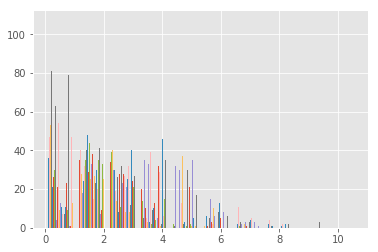

In [226]:
plt.hist(code_log)

# Split at a value of 200

In [267]:
split = aisles_to_aisles.copy()

In [268]:
for key in split:
    for k in split[key]:
        if split[key][k] < 2000 or key == k:
            split[key][k] = np.nan

In [269]:
split= pd.DataFrame(split).fillna(0)

In [270]:
list_of_lists = []
for row in split.iterrows():
    index, data = row
    list_of_lists.append(data.tolist())

# Highest Range of Aisle


In [231]:
i = 1
high = []
for sub in list_of_lists:
    if sum(sub) != 0:
        high.append([i, sum(sub)])
    i += 1

In [299]:
#high = sorted(high, key=itemgetter(1), reverse=True)
#high

In [281]:
while len(high) > 10:
    del high[-1]
high

[[24, 98201.0],
 [83, 96921.0],
 [123, 61466.0],
 [120, 31521.0],
 [21, 30375.0],
 [107, 19546.0],
 [84, 17943.0],
 [115, 16243.0],
 [91, 14159.0],
 [112, 13879.0]]

In [282]:
my_list = [24,83,123,120,21,107,84,115,91,112]

In [283]:
high_df = pd.DataFrame(columns = [24,83,123,120,21,107,84,115,91,112])

In [284]:
for item in high:
    high_df = high_df.append(code.iloc[item[0]])

In [286]:
high_df.index -= 1

In [290]:
high_df= high_df.fillna(0)
high_df

,24,83,123,120,21,107,84,115,91,112,...,125,126,127,128,129,130,131,132,133,134
23,167.0,157.0,97.0,64.0,55.0,34.0,48.0,69.0,46.0,27.0,...,1.0,8.0,19.0,8.0,8.0,16.0,20.0,7.0,6.0,0.0
82,3573.0,1737.0,1228.0,1429.0,842.0,428.0,1540.0,724.0,735.0,626.0,...,21.0,21.0,25.0,120.0,126.0,115.0,160.0,1.0,13.0,6.0
122,17.0,11.0,12.0,4.0,10.0,11.0,11.0,22.0,4.0,13.0,...,0.0,0.0,2.0,3.0,6.0,0.0,3.0,0.0,0.0,11.0
119,1173.0,756.0,539.0,618.0,372.0,405.0,578.0,292.0,439.0,320.0,...,23.0,9.0,33.0,87.0,91.0,157.0,115.0,3.0,12.0,1.0
20,49.0,46.0,34.0,16.0,29.0,27.0,15.0,21.0,16.0,15.0,...,2.0,3.0,54.0,6.0,6.0,8.0,7.0,4.0,6.0,0.0
106,942.0,1129.0,533.0,463.0,732.0,296.0,346.0,200.0,187.0,246.0,...,6.0,5.0,10.0,165.0,91.0,40.0,143.0,1.0,4.0,2.0
83,127.0,135.0,72.0,42.0,57.0,62.0,26.0,64.0,29.0,32.0,...,4.0,3.0,13.0,15.0,12.0,11.0,14.0,0.0,4.0,1.0
114,2491.0,2259.0,1633.0,712.0,534.0,310.0,345.0,309.0,502.0,256.0,...,8.0,7.0,12.0,105.0,168.0,99.0,142.0,2.0,7.0,1.0
90,816.0,528.0,385.0,396.0,226.0,117.0,247.0,183.0,119.0,106.0,...,8.0,6.0,9.0,32.0,82.0,55.0,61.0,0.0,3.0,0.0
111,16.0,10.0,16.0,9.0,5.0,7.0,8.0,6.0,5.0,7.0,...,0.0,0.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0


In [291]:
df = high_df[[24,83,123,120,21,84,16,115,91,112]]
df

,24,83,123,120,21,84,16,115,91,112
23,167.0,157.0,97.0,64.0,55.0,48.0,27.0,69.0,46.0,27.0
82,3573.0,1737.0,1228.0,1429.0,842.0,1540.0,163.0,724.0,735.0,626.0
122,17.0,11.0,12.0,4.0,10.0,11.0,3.0,22.0,4.0,13.0
119,1173.0,756.0,539.0,618.0,372.0,578.0,57.0,292.0,439.0,320.0
20,49.0,46.0,34.0,16.0,29.0,15.0,2.0,21.0,16.0,15.0
106,942.0,1129.0,533.0,463.0,732.0,346.0,138.0,200.0,187.0,246.0
83,127.0,135.0,72.0,42.0,57.0,26.0,16.0,64.0,29.0,32.0
114,2491.0,2259.0,1633.0,712.0,534.0,345.0,203.0,309.0,502.0,256.0
90,816.0,528.0,385.0,396.0,226.0,247.0,18.0,183.0,119.0,106.0
111,16.0,10.0,16.0,9.0,5.0,8.0,1.0,6.0,5.0,7.0


In [292]:
list_of_lists = []
for row in df.iterrows():
    index, data = row
    list_of_lists.append(data.tolist())

In [293]:
list_of_lists

[[167.0, 157.0, 97.0, 64.0, 55.0, 48.0, 27.0, 69.0, 46.0, 27.0],
 [3573.0, 1737.0, 1228.0, 1429.0, 842.0, 1540.0, 163.0, 724.0, 735.0, 626.0],
 [17.0, 11.0, 12.0, 4.0, 10.0, 11.0, 3.0, 22.0, 4.0, 13.0],
 [1173.0, 756.0, 539.0, 618.0, 372.0, 578.0, 57.0, 292.0, 439.0, 320.0],
 [49.0, 46.0, 34.0, 16.0, 29.0, 15.0, 2.0, 21.0, 16.0, 15.0],
 [942.0, 1129.0, 533.0, 463.0, 732.0, 346.0, 138.0, 200.0, 187.0, 246.0],
 [127.0, 135.0, 72.0, 42.0, 57.0, 26.0, 16.0, 64.0, 29.0, 32.0],
 [2491.0, 2259.0, 1633.0, 712.0, 534.0, 345.0, 203.0, 309.0, 502.0, 256.0],
 [816.0, 528.0, 385.0, 396.0, 226.0, 247.0, 18.0, 183.0, 119.0, 106.0],
 [16.0, 10.0, 16.0, 9.0, 5.0, 8.0, 1.0, 6.0, 5.0, 7.0]]

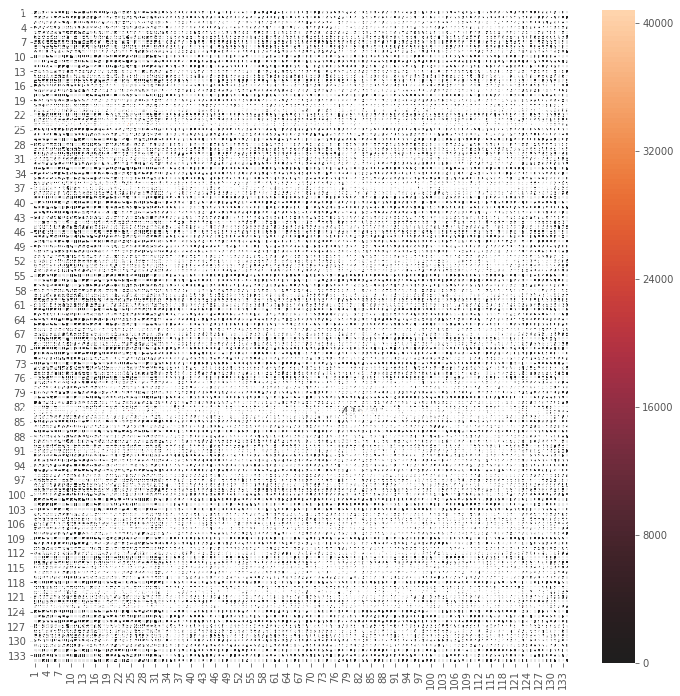

In [263]:
a4_dims = (12, 12)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sbn.heatmap(code, vmin=0,center=0, annot=True, linewidths=.5, color="Red")

CPU times: user 2min 12s, sys: 364 ms, total: 2min 12s
Wall time: 2min 12s


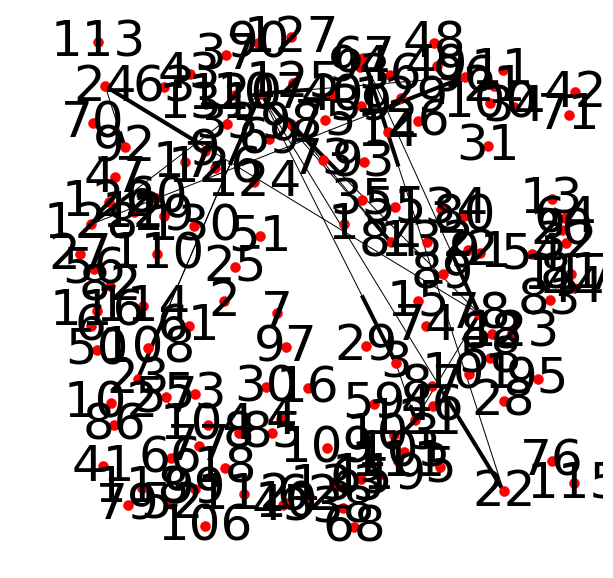

In [298]:
%%time
g = nx.DiGraph()
g.add_nodes_from(code)
for i in list(set(merge_flow.order_id)):
    roup_df = group.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True)
    aisles_list = list(group_df.aisle_id)
    g.add_edges_from(list(zip(aisles_list,aisles_list[1:])))
gfig, gax = plt.subplots(figsize = (10,10))
nx.draw(g,nx.spring_layout(g, k=0.5, iterations = 1), ax=gax, with_labels = True, font_size = 50, node_size = 100)

In [277]:
%load_ext py_d3

The py_d3 extension is already loaded. To reload it, use:
  %reload_ext py_d3


In [297]:
%%d3 4.11.0

<style>

.group-tick line {
  stroke: #000;
}

.ribbons {
  fill-opacity: 0.67;
}
</style>

<svg width=960 height=960></svg>

<script>
var matrix =[[167.0, 157.0, 97.0, 64.0, 55.0, 48.0, 27.0, 69.0, 46.0, 27.0],
 [3573.0, 1737.0, 1228.0, 1429.0, 842.0, 1540.0, 163.0, 724.0, 735.0, 626.0],
 [17.0, 11.0, 12.0, 4.0, 10.0, 11.0, 3.0, 22.0, 4.0, 13.0],
 [1173.0, 756.0, 539.0, 618.0, 372.0, 578.0, 57.0, 292.0, 439.0, 320.0],
 [49.0, 46.0, 34.0, 16.0, 29.0, 15.0, 2.0, 21.0, 16.0, 15.0],
 [942.0, 1129.0, 533.0, 463.0, 732.0, 346.0, 138.0, 200.0, 187.0, 246.0],
 [127.0, 135.0, 72.0, 42.0, 57.0, 26.0, 16.0, 64.0, 29.0, 32.0],
 [2491.0, 2259.0, 1633.0, 712.0, 534.0, 345.0, 203.0, 309.0, 502.0, 256.0],
 [816.0, 528.0, 385.0, 396.0, 226.0, 247.0, 18.0, 183.0, 119.0, 106.0],
 [16.0, 10.0, 16.0, 9.0, 5.0, 8.0, 1.0, 6.0, 5.0, 7.0]];

var svg = d3.select("svg"),
    width = +svg.attr("width"),
    height = +svg.attr("height"),
    outerRadius = Math.min(width, height) * 0.5 - 40,
    innerRadius = outerRadius - 30;

var formatValue = d3.formatPrefix(",.0", 1e3);

var chord = d3.chord()
    .padAngle(0.05)
    .sortSubgroups(d3.descending);

var arc = d3.arc()
    .innerRadius(innerRadius)
    .outerRadius(outerRadius);

var ribbon = d3.ribbon()
    .radius(innerRadius);

var color = d3.scaleOrdinal()
    .domain(d3.range(4))
    .range(["#000000", "#FFDD89", "#957244", "#F26223"]);

var g = svg.append("g")
    .attr("transform", "translate(" + width / 2 + "," + height / 2 + ")")
    .datum(chord(matrix));

var group = g.append("g")
    .attr("class", "groups")
  .selectAll("g")
  .data(function(chords) { return chords.groups; })
  .enter().append("g");

group.append("path")
    .style("fill", function(d) { return color(d.index); })
    .style("stroke", function(d) { return d3.rgb(color(d.index)).darker(); })
    .attr("d", arc);

var groupTick = group.selectAll(".group-tick")
  .data(function(d) { return groupTicks(d, 1e3); })
  .enter().append("g")
    .attr("class", "group-tick")
    .attr("transform", function(d) { return "rotate(" + (d.angle * 180 / Math.PI - 90) + ") translate(" + outerRadius + ",0)"; });

groupTick.append("line")
    .attr("x2", 6);

groupTick
  .filter(function(d) { return d.value % 5e3 === 0; })
  .append("text")
    .attr("x", 8)
    .attr("dy", ".35em")
    .attr("transform", function(d) { return d.angle > Math.PI ? "rotate(180) translate(-16)" : null; })
    .style("text-anchor", function(d) { return d.angle > Math.PI ? "end" : null; })
    .text(function(d) { return formatValue(d.value); });

g.append("g")
    .attr("class", "ribbons")
  .selectAll("path")
  .data(function(chords) { return chords; })
  .enter().append("path")
    .attr("d", ribbon)
    .style("fill", function(d) { return color(d.target.index); })
    .style("stroke", function(d) { return d3.rgb(color(d.target.index)).darker(); });

// Returns an array of tick angles and values for a given group and step.
function groupTicks(d, step) {
  var k = (d.endAngle - d.startAngle) / d.value;
  return d3.range(0, d.value, step).map(function(value) {
    return {value: value, angle: value * k + d.startAngle};
  });
}

</script>
